# AIML421, Assignment 4 (Part A), Corvin Idler, Student ID 300598312, idlercorv@myvuw.ac.nz

Installing pandas profiling tools to colab

In [35]:
%%capture
!sudo apt-get update
!sudo apt-get -y install gcc
!pip install --upgrade setuptools wheel 
!pip install bottleneck  --no-binary :all:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip   

Importing everything I need

In [50]:
from pandas_profiling import ProfileReport
import pandas as pd
from IPython.display import display
pd.options.display.float_format = '{:,.2f}'.format

#Linear regression, Ridge regression, SGD regression
from sklearn import linear_model
#k-neighbors regression
from sklearn.neighbors import KNeighborsRegressor
#tree regression
from sklearn.tree import DecisionTreeRegressor
#random forest regressor 
from sklearn.ensemble import RandomForestRegressor
#gradient Boosting regression
from sklearn.ensemble import GradientBoostingRegressor
#support vector regression (SVR) and linear SVR
from sklearn.svm import SVR
#multi-layer perceptron regression
from sklearn.neural_network import MLPRegressor
import seaborn as sns
sns.set(style='whitegrid')
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline 
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['figure.dpi'] = 200
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa
# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer
from sklearn import preprocessing 
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

Load Data, having a peekie and setting the index column (Unnamed: 0) as index for the data frame and then drop it

In [9]:
diamond = pd.read_csv('diamonds.csv',index_col=False)
diamond.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,x,y,z,price
0,1,0.23,Ideal,E,SI2,61.5,55.0,3.95,3.98,2.43,326
1,2,0.21,Premium,E,SI1,59.8,61.0,3.89,3.84,2.31,326
2,3,0.23,Good,E,VS1,56.9,65.0,4.05,4.07,2.31,327
3,4,0.29,Premium,I,VS2,62.4,58.0,4.20,4.23,2.63,334
4,5,0.31,Good,J,SI2,63.3,58.0,4.34,4.35,2.75,335


In [10]:
diamond = diamond.set_index('Unnamed: 0',drop=True)

In [11]:
diamond.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53940 entries, 1 to 53940
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   x        53940 non-null  float64
 7   y        53940 non-null  float64
 8   z        53940 non-null  float64
 9   price    53940 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 4.5+ MB


In [12]:
diamond.describe()

,carat,depth,table,x,y,z,price
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,5.731157,5.734526,3.538734,3932.799722
std,0.474011,1.432621,2.234491,1.121761,1.142135,0.705699,3989.439738
min,0.200000,43.000000,43.000000,0.000000,0.000000,0.000000,326.000000
25%,0.400000,61.000000,56.000000,4.710000,4.720000,2.910000,950.000000
50%,0.700000,61.800000,57.000000,5.700000,5.710000,3.530000,2401.000000
75%,1.040000,62.500000,59.000000,6.540000,6.540000,4.040000,5324.250000
max,5.010000,79.000000,95.000000,10.740000,58.900000,31.800000,18823.000000


## Initial Data Analysis + Exploratory Data Analysis
We doesn't seem to have any sizable amount of missing data. There are some entries with zero X, Y or Z dimensions. We could exclude them from the data set or estimate them e.g. in a MICE fashion. I ended up opting for imputation.
Some numerical variables are highly skewed (including the target variable).
Some intersting domain reading https://www.diamonds.pro/guides/diamond-proportion/

In [13]:
profile = ProfileReport(diamond, title="Pandas Profiling Report", explorative=True)
#profile.to_notebook_iframe()
#profile.to_file("output.html")
profile.to_widgets()


Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

# Pre-precossing:
Split test and training data set
Need to turn categorical variables into numerical

In [14]:
X_train, X_test, Y_train, Y_test =  train_test_split(diamond.drop('price', axis = 1),diamond['price'], train_size=0.7, test_size=0.3,random_state=309)

numerical_cols = diamond.select_dtypes(include=np.number).columns.to_list()
categorical_cols = diamond.select_dtypes(exclude=np.number).columns.to_list()
categorical_cols

OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols = pd.DataFrame(OH_encoder.fit_transform(X_train[categorical_cols]),columns=OH_encoder.get_feature_names(['cut', 'color', 'clarity']))
# One-hot encoding removed index; put it back
OH_cols.index = X_train.index
# Remove categorical columns (will replace with one-hot encoding)
num_X_train = X_train.drop(categorical_cols, axis=1)

# Add one-hot encoded columns to numerical features
X_train = pd.concat([num_X_train, OH_cols], axis=1)

OH_cols = pd.DataFrame(OH_encoder.transform(X_test[categorical_cols]),columns=OH_encoder.get_feature_names(['cut', 'color', 'clarity']))
# One-hot encoding removed index; put it back
OH_cols.index = X_test.index
# Remove categorical columns (will replace with one-hot encoding)
num_X_test = X_test.drop(categorical_cols, axis=1)

# Add one-hot encoded columns to numerical features
X_test = pd.concat([num_X_test, OH_cols], axis=1)



Filling in missing values in a MICE fashion.
Normalizing numeric variables as many are highly non-normal and some heavily skewed. Using box cox and quantile transformation.
Code mainly taken from 
https://scikit-learn.org/stable/auto_examples/preprocessing/plot_map_data_to_normal.html


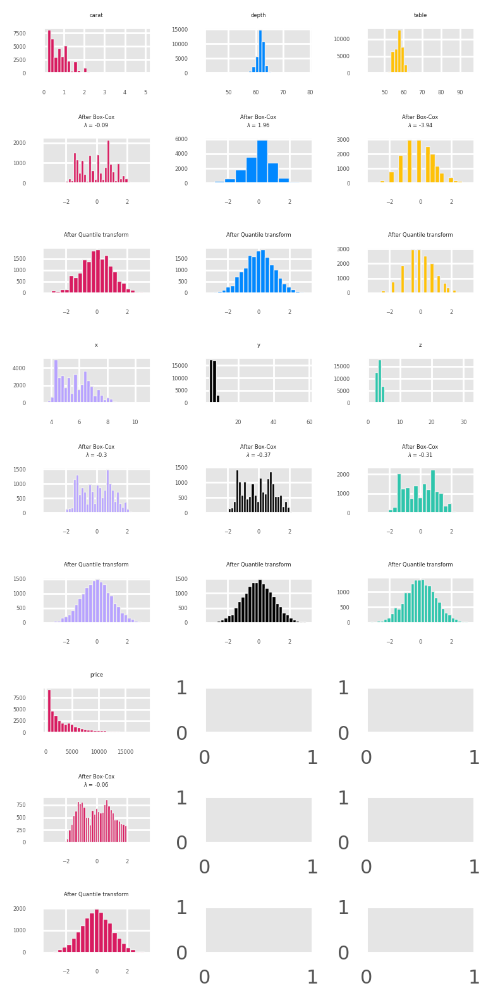

In [15]:

myII = IterativeImputer(missing_values=0)
X_train["x"]=myII.fit(X_train["x"].values.reshape(-1, 1)).transform(X_train["x"].values.reshape(-1, 1))
X_train["y"]=myII.fit(X_train["y"].values.reshape(-1, 1)).transform(X_train["y"].values.reshape(-1, 1)) 
X_train["z"]=myII.fit(X_train["z"].values.reshape(-1, 1)).transform(X_train["z"].values.reshape(-1, 1)) 

X_test["x"]=myII.fit(X_train["x"].values.reshape(-1, 1)).transform(X_test["x"].values.reshape(-1, 1)) 
X_test["y"]=myII.fit(X_train["y"].values.reshape(-1, 1)).transform(X_test["y"].values.reshape(-1, 1)) 
X_test["z"]=myII.fit(X_train["z"].values.reshape(-1, 1)).transform(X_test["z"].values.reshape(-1, 1)) 


train=pd.concat([X_train,Y_train], axis=1)
test=pd.concat([X_test,Y_test], axis=1)

train_qt=pd.concat([X_train,Y_train], axis=1)
test_qt=pd.concat([X_test,Y_test], axis=1)

train_bc=pd.concat([X_train,Y_train], axis=1)
test_bc=pd.concat([X_test,Y_test], axis=1)



FONT_SIZE = 3
BINS = 30


rng = np.random.RandomState(309)
bc = PowerTransformer(method='box-cox')
# n_quantiles is set to the training set size rather than the default value
# to avoid a warning being raised by this example
qt = QuantileTransformer(output_distribution='normal',random_state=rng)


# create plots
distributions = [
    'carat',
    'depth',
    'table',
    'x',
    'y',
    'z',
    'price'
]
 

colors = ['#D81B60', '#0188FF', '#FFC107',
          '#B7A2FF', '#000000', '#2EC5AC','#D81B60']

fig, axes = plt.subplots(nrows=9, ncols=3, figsize=plt.figaspect(2))
axes = axes.flatten()
axes_idxs = [(0, 3, 6), (1, 4, 7), (2, 5, 8), (9, 12, 15),
             (10, 13, 16), (11, 14, 17),(18, 21, 24)]
axes_list = [(axes[i], axes[j], axes[k])
             for (i, j, k) in axes_idxs]


for distribution, color, axes in zip(distributions, colors, axes_list):
    # perform power transforms and quantile transform
    trans_bc = bc.fit(train.loc[:,train.columns == distribution]).transform(test.loc[:,test.columns == distribution])
    test_bc[distribution]=trans_bc
    train_bc[distribution]=bc.transform(train.loc[:,train.columns == distribution])

    lmbda_bc = round(bc.lambdas_[0], 2)
    trans_qt = qt.fit(train.loc[:,train.columns == distribution]).transform(test.loc[:,test.columns == distribution])
    test_qt[distribution]=trans_qt
    train_qt[distribution]=qt.transform(train.loc[:,train.columns == distribution])

    ax_original, ax_bc, ax_qt = axes
    ax_original.hist(train.loc[:,train.columns == distribution].values, color=color, bins=BINS)
    ax_original.set_title(distribution, fontsize=FONT_SIZE)
    ax_original.tick_params(axis='both', which='major', labelsize=FONT_SIZE)


    for ax, trans, meth_name, lmbda in zip(
            (ax_bc, ax_qt),
            (trans_bc,  trans_qt),
            ('Box-Cox', 'Quantile transform'),
            (lmbda_bc, None)):
        ax.hist(trans, color=color, bins=BINS)
        title = 'After {}'.format(meth_name)
        if lmbda is not None:
            title += '\n$\\lambda$ = {}'.format(lmbda)
        ax.set_title(title, fontsize=FONT_SIZE)
        ax.tick_params(axis='both', which='major', labelsize=FONT_SIZE)
        ax.set_xlim([-3.5, 3.5])



plt.tight_layout()
plt.show()

It goes without saying that the quantile transformation leads to better results in terms of "normalizing" the distribution. Will do a test lateron if that also translates into better prediction results.

# Outlier Analysis
inspired by https://www.kaggle.com/heeraldedhia/regression-on-diamonds-dataset-95-score/notebook I did an outlier analysis and there are certainly some. Many of them are due to the missing entries (zero on x, y, z) and a lot of the others are univariate outliers (in one dimension). Given the amount of overall datapoints I don't think I need to spent too much time eliminating the outliers from the training set and I would be tempted to do this (if at all) only for multivariate outliers... which complicates a bit the outlier identification (e.g. statsitical multivariate quality control algorithms or machine learning algorithms like single forest etc). Long story short, I decided to leave things and see what happens.

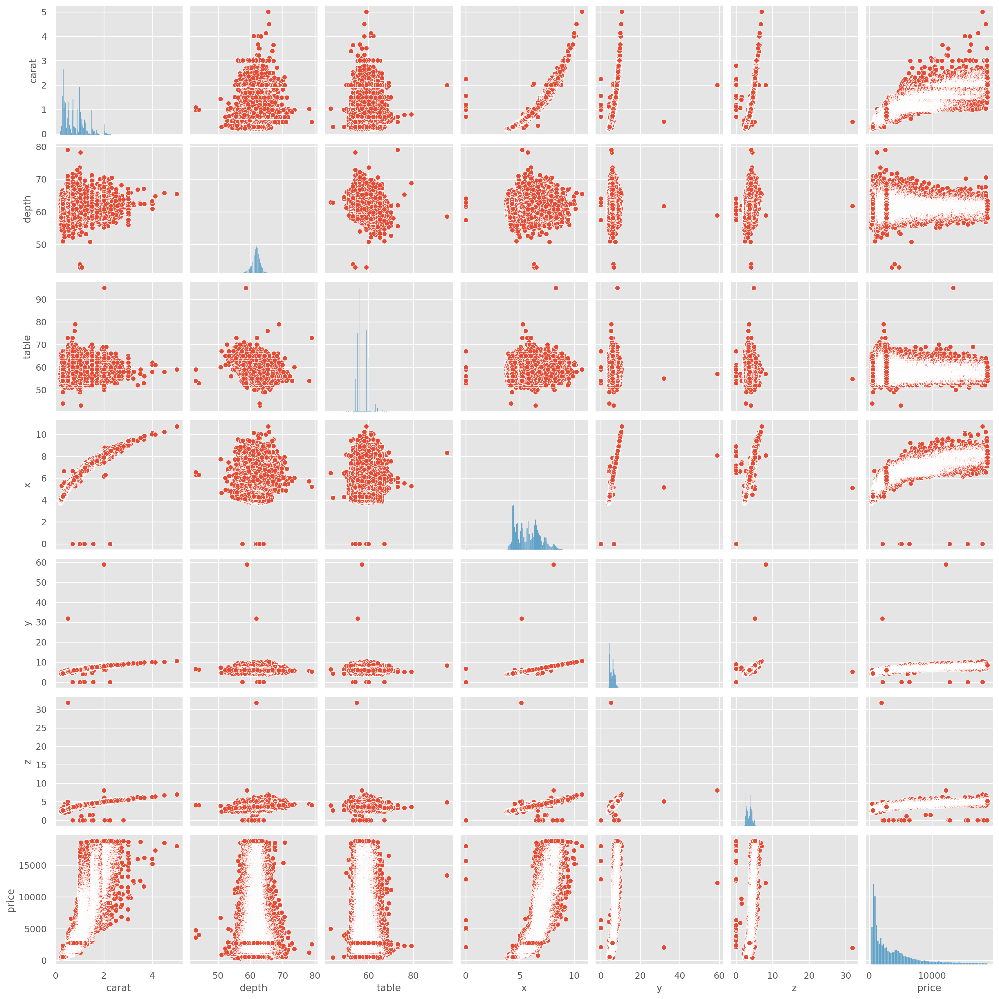

In [16]:
sns.pairplot(diamond)

Inspired by the same source as the above charts I thought it would be fun to plot the volume against the weight to identify really oddly shaped diamonds. I would argue those might be more "meaningful" outliers. But again, given the overall number of data points compared to the number of outliers I decided leave them be to just see what happens.

<AxesSubplot:ylabel='carat'>

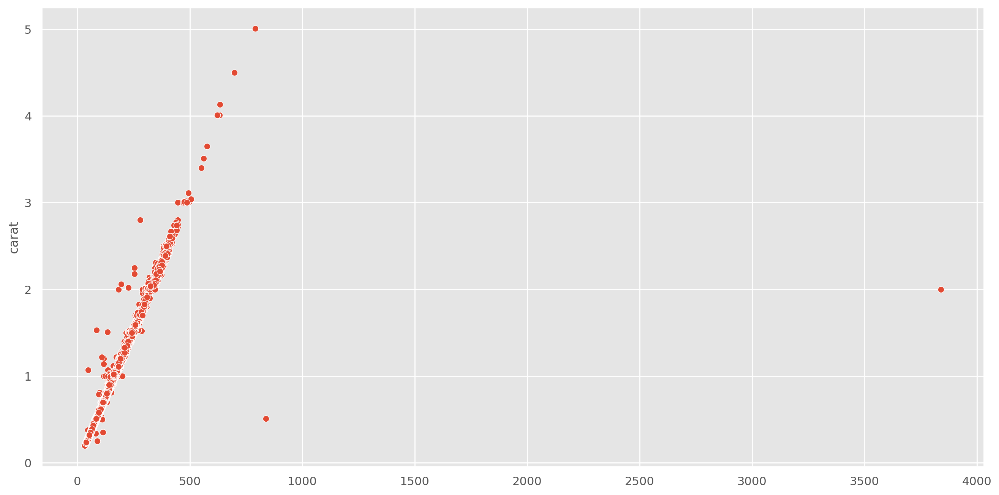

In [17]:
sns.scatterplot(data=train, x=train['x']*train['y']*train['z'], y=train['carat'])

# Modelling

First thing I wanted to find out was if there was a meaningful difference between raw data, box cox normalisation and quantile transformation. As a test case I used OLS. Turns out that quantile might have destroyed some meaningful relationships in the data or "overfit" the training data. So the box-cox transfromation leads to better results in the particularly scenario. I didn't have enough computing time, but it would be interesting to do a meta study across the various algorithms to see if above finding holds true across all of them (at least for this particular data set).

In [121]:
results = pd.DataFrame(columns = ['Algorithm', 'RMSE', 'MSE', 'MAE', 'RSE','R2'])
np.set_printoptions(2)

In [122]:
regr_ols = linear_model.LinearRegression()
model_ols = regr_ols.fit(X_train, Y_train)
y_pred = model_ols.predict(X_test)

results.loc[0] = ['Linear regression (OLS)', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
y_pred_ols=y_pred
results

,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96


In [123]:
X_train_bc=train_bc.drop('price', axis = 1)
X_test_bc=test_bc.drop('price', axis = 1)

Y_train_bc=train_bc['price']
Y_test_bc=test_bc['price']


regr_ols_bc = linear_model.LinearRegression()
model_ols_bc = regr_ols_bc.fit(X_train_bc, Y_train_bc)
y_pred = model_ols_bc.predict(X_test_bc)
y_pred = pd.DataFrame(bc.inverse_transform(y_pred.reshape(-1, 1)))

results.loc[1] = ['Linear regression (OLS) with Box-Cox', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]

y_pred_ols_bc=y_pred
results

,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98


In [124]:
X_train_qt=train_qt.drop('price', axis = 1)
X_test_qt=test_qt.drop('price', axis = 1)
Y_train_qt=train_qt['price']
Y_test_qt=test_qt['price']

regr_ols_qt = linear_model.LinearRegression()
model_ols_qt = regr_ols_qt.fit(X_train_qt, Y_train_qt)
y_pred = model_ols_qt.predict(X_test_qt)
y_pred=qt.inverse_transform(y_pred.reshape(-1, 1))
y_pred_ols_qt=y_pred

results.loc[2] = ['Linear regression (OLS) with quantile transformation', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results

,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97


Looks like box cox is the winner. Will use that from hereon

In [125]:
regr_ridge = linear_model.RidgeCV(alphas=np.logspace(-3, 6, 50), cv=10)
model_ridge = regr_ridge.fit(X_train_bc, Y_train_bc)
y_pred = model_ridge.predict(X_test_bc)

y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_ridge=y_pred

results.loc[3] = ['Linear regression (Ridge)', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results

,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98


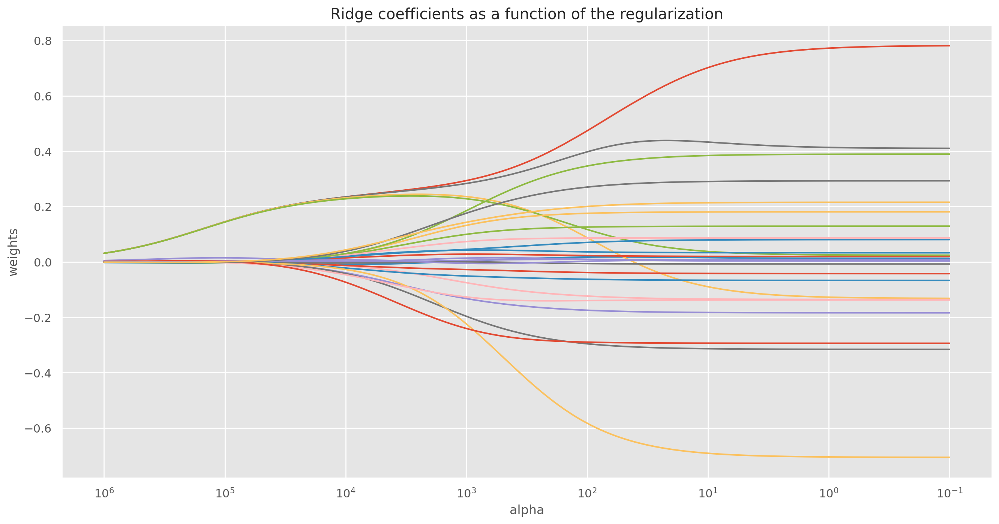

In [126]:
# X is the 10x10 Hilbert matrix
X = 1. / (np.arange(1, 11) + np.arange(0, 10)[:, np.newaxis])
y = np.ones(10)

# #############################################################################
# Compute paths

n_alphas = 200
alphas = np.logspace(-1, 6, n_alphas)

coefs = []
for a in alphas:
    ridge = linear_model.Ridge(alpha=a, fit_intercept=False)
    ridge.fit(X_train_bc, Y_train_bc)
    coefs.append(ridge.coef_)

# #############################################################################
# Display results

ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
ax.set_xlim(ax.get_xlim()[::-1])  # reverse axis
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization')
plt.axis('tight')
plt.show()

In [127]:
regr_DT = DecisionTreeRegressor()

parameters={"splitter":["best","random"],
            "max_depth" : [17,19,21,23],
           "min_samples_leaf":[3,5,7],
           "max_features":["auto"],
           "max_leaf_nodes":[None] }
tuning_model_DT=GridSearchCV(regr_DT,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_DT.fit(X_train_bc, Y_train_bc)



y_pred = tuning_model_DT.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_DT=y_pred
print(tuning_model_DT.best_params_)
results.loc[4] = ['Decision Tree', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 24 candidates, totalling 240 fits
{'max_depth': 19, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_samples_leaf': 5, 'splitter': 'best'}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99


In [128]:
regr_KNN = KNeighborsRegressor()
# Define our candidate hyperparameters

parameters={"n_neighbors": [8,9,10],
            "weights": ['distance'],
            "p": [1,2]
           }
tuning_model_KNN=GridSearchCV(regr_KNN,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_KNN.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_KNN.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_KNN=y_pred
print(tuning_model_KNN.best_params_)
results.loc[5] = ['KNN', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 6 candidates, totalling 60 fits
{'n_neighbors': 9, 'p': 1, 'weights': 'distance'}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98


In [129]:
regr_RF = RandomForestRegressor(random_state=309,n_jobs=-1)
# Define our candidate hyperparameters

parameters = {
    'n_estimators'      : [600,1000],
    'max_depth'         : [20,22,24],
}
tuning_model_RF=GridSearchCV(regr_RF,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True)

tuning_model_RF.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_RF.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_RF=y_pred
print(tuning_model_RF.best_params_)
results.loc[6] = ['RF', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 6 candidates, totalling 60 fits
{'max_depth': 22, 'n_estimators': 1000}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99


In [130]:
regr_GBD = GradientBoostingRegressor(random_state=309)
# Define our candidate hyperparameters

parameters = {
    'learning_rate': [0.01,0.03],
              'n_estimators' : [400,500,600],
              'max_depth'    : [8,9,10]
              }

tuning_model_GBD=GridSearchCV(regr_GBD,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_GBD.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_GBD.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_GBD=y_pred
print(tuning_model_GBD.best_params_)
results.loc[7] = ['Gradient Boosted Decision Trees', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 18 candidates, totalling 180 fits
{'learning_rate': 0.03, 'max_depth': 9, 'n_estimators': 600}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99


In [131]:
regr_SGD = linear_model.SGDRegressor(random_state=309)
# Define our candidate hyperparameters


parameters = {
    'alpha': 10.0 ** -np.arange(5, 20),
    'penalty': ['l2', 'l1'],
    'learning_rate': ['optimal','adaptive']
}

tuning_model_SGD=GridSearchCV(regr_SGD,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_SGD.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_SGD.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_SGD=y_pred
print(tuning_model_SGD.best_params_)
results.loc[8] = ['linear regression SGD', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 60 candidates, totalling 600 fits
{'alpha': 1e-05, 'learning_rate': 'adaptive', 'penalty': 'l1'}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99
8,linear regression SGD,823.76,"678,580.22",410.25,0.04,0.98


In [132]:
regr_SVR = SVR(kernel='linear', gamma='auto')

parameters = {
    'C': [0.001,0.01,0.1]
}

tuning_model_SVR=GridSearchCV(regr_SVR,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_SVR.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_SVR.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_SVR=y_pred
print(tuning_model_SVR.best_params_)
results.loc[9] = ['linear support vector regression', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results

Fitting 10 folds for each of 3 candidates, totalling 30 fits
{'C': 0.01}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99
8,linear regression SGD,823.76,"678,580.22",410.25,0.04,0.98
9,linear support vector regression,838.18,"702,539.93",412.60,0.04,0.98


In [133]:
regr_svr_poly = SVR(kernel='poly', gamma='auto', epsilon=.1,coef0=1,max_iter=1000)

parameters = {
    'C': [0.5,1,2],
    'degree': [2,3,4]
}

tuning_model_SVR_poly=GridSearchCV(regr_svr_poly,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_SVR_poly.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_SVR_poly.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_SVR_poly=y_pred
print(tuning_model_SVR_poly.best_params_)
results.loc[10] = ['polynomial support vector regression', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results

Fitting 10 folds for each of 9 candidates, totalling 90 fits
{'C': 1, 'degree': 3}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99
8,linear regression SGD,823.76,"678,580.22",410.25,0.04,0.98
9,linear support vector regression,838.18,"702,539.93",412.60,0.04,0.98


In [134]:
regr_svr_rbf = SVR(kernel='rbf', gamma='auto', epsilon=.1,coef0=1,max_iter=1000)

parameters = {
    'C': [0.5,1,2],
}

tuning_model_SVR_rbf=GridSearchCV(regr_svr_rbf,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_SVR_rbf.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_SVR_rbf.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_SVR_rbf=y_pred
print(tuning_model_SVR_rbf.best_params_)
results.loc[11] = ['radial basis function support vector regression', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results

Fitting 10 folds for each of 3 candidates, totalling 30 fits
{'C': 1}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99
8,linear regression SGD,823.76,"678,580.22",410.25,0.04,0.98
9,linear support vector regression,838.18,"702,539.93",412.60,0.04,0.98


In [135]:
regr_mlp=MLPRegressor()
parameters = {"hidden_layer_sizes": [(100,),(150,),(200,)], "activation": ["relu"], "solver": ["lbfgs","adam"], "alpha": [0.00005,0.0005],"max_iter": [1000]}

tuning_model_mlp=GridSearchCV(regr_mlp,param_grid=parameters,scoring='neg_mean_squared_error',cv=10,verbose=1,refit=True,n_jobs=-1)

tuning_model_mlp.fit(X_train_bc, Y_train_bc)

y_pred = tuning_model_mlp.best_estimator_.predict(X_test_bc)
y_pred=bc.inverse_transform(y_pred.reshape(-1, 1))
y_pred_mlp=y_pred
print(tuning_model_mlp.best_params_)
results.loc[12] = ['MLP', 
                   np.sqrt(mean_squared_error((Y_test),(y_pred))),
                   mean_squared_error((Y_test),(y_pred)),
                   mean_absolute_error((Y_test),(y_pred)),
                   mean_squared_error((Y_test),(y_pred))*Y_test.shape[0] / np.sum(np.square(np.subtract(np.array(Y_test), np.mean(np.array(Y_test))))),
                   np.sqrt(r2_score((Y_test),(y_pred)))
                 ]
results


Fitting 10 folds for each of 12 candidates, totalling 120 fits
{'activation': 'relu', 'alpha': 0.0005, 'hidden_layer_sizes': (100,), 'max_iter': 1000, 'solver': 'lbfgs'}


,Algorithm,RMSE,MSE,MAE,RSE,R2
0,Linear regression (OLS),"1,148.23","1,318,428.47",738.57,0.08,0.96
1,Linear regression (OLS) with Box-Cox,823.67,"678,436.89",410.11,0.04,0.98
2,Linear regression (OLS) with quantile transfor...,908.93,"826,146.95",531.53,0.05,0.97
3,Linear regression (Ridge),825.08,"680,758.18",410.50,0.04,0.98
4,Decision Tree,661.56,"437,655.02",325.74,0.03,0.99
5,KNN,759.88,"577,417.47",359.85,0.04,0.98
6,RF,555.55,"308,636.73",272.15,0.02,0.99
7,Gradient Boosted Decision Trees,547.96,"300,256.19",265.74,0.02,0.99
8,linear regression SGD,823.76,"678,580.22",410.25,0.04,0.98
9,linear support vector regression,838.18,"702,539.93",412.60,0.04,0.98
